# **Lab 3: CNN Visualization**
    - Salissa Hernandez
    - Juan Carlos Dominguez
    - Leonardo Piedrahita
    - Brice Danvide

### Details
In this lab you will find and analyze a circuit in a common neural network.  A reference figure is also shown to help clarify the process of finding and analyzing deep circuits.

The terminology used in this labs is as follows: 
- (1) a filter refers to the entire tensor that convolves with an input across all channels (i.e., a multi-channel filter like a 3x3x64 tensor), 
- (2) a single channel filter refers to one channel of the aforementioned filter (e.g., a 3x3x1 convolution kernel), 
- (3) and activation refers to the input or output of the filter depending on context (i.e., input activations for a filter are the inputs from a previous layer, output activations are all the filter outputs from a convolutional layer), 
- (4) an input can refer to all input channels or a single input channel depending on the context (entire filter or single channel filter, respectively). 
A diagram is provided for clarity and this was covered in detail in the class lecture. 

# **Table of Contents**
- [1. Convulational Neural Network Model Pre-Trained on Large Dataset](#1-convulational-neural-network-model-pre-trained-on-large-dataset)
- [2. Multi-Channel Filter](#2-multi-channel-filter)
- [3. Analyzing Each Channel of the Multi-Channel Filter](#3-analyzing-each-channel-of-the-multi-channel-filter)
- [4. Image Gradient Technique Visualizations](#4-image-gradient-technique-visualizations)

# **Dataset**


### **Resources**
- https://keras.io/api/applications/
- https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb

# **Understanding Convolutional Neural Networks (CNNs) and Their Interpretability**  

Convolutional Neural Networks (CNNs) are a class of deep learning models designed for processing structured grid data, such as images. Unlike traditional fully connected neural networks, CNNs utilize convolutional layers to automatically detect spatial hierarchies of features, making them highly effective for image classification and other computer vision tasks (LeCun et al., 1998). Through weight-sharing mechanisms and local receptive fields, CNNs significantly reduce computational complexity while preserving spatial relationships within images (Krizhevsky et al., 2012).  

One of the key strengths of CNNs is their ability to learn hierarchical feature representations. Early layers in the network detect low-level features such as edges and textures, while deeper layers capture higher-level abstractions like object parts and complete structures (Zeiler & Fergus, 2014). However, despite their effectiveness, CNNs often function as **black-box models**, where decision-making processes are not easily interpretable. This lack of transparency can lead to challenges in understanding **why** a model makes certain predictions, raising concerns in areas such as model trustworthiness, bias detection, and robustness (Samek et al., 2017).  

To improve interpretability, visualization techniques are commonly employed to analyze CNN behavior. These techniques include:  

- **Filter and Feature Map Visualizations** – Examining activation patterns within convolutional layers to understand what features are being detected (Simonyan et al., 2014).  
- **Class Activation Mapping (CAM)** – Highlighting regions in an image that contribute most to a specific classification decision (Zhou et al., 2016).  
- **Gradient-Based Methods** – Using backpropagation to identify pixel-level contributions to predictions, such as through saliency maps and guided backpropagation (Springenberg et al., 2015).  

For this project, a **pre-trained CNN model** will be selected to perform image classification and further analyzed for interpretability. Specifically, **VGG19**, a deep CNN trained on the **ImageNet** dataset, will be utilized due to its structured architecture, which facilitates clearer visualization of learned filters and feature hierarchies (Simonyan & Zisserman, 2014). By classifying a set of images and investigating internal representations, the study aims to explore how CNNs process visual information and assess the effectiveness of visualization techniques in understanding model behavior.  


## **References**  

- Krizhevsky, A., Sutskever, I., & Hinton, G. E. (2012). *ImageNet classification with deep convolutional neural networks*. Advances in Neural Information Processing Systems, 25, 1097-1105.  
    - https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf
- LeCun, Y., Bottou, L., Bengio, Y., & Haffner, P. (1998). *Gradient-based learning applied to document recognition*. Proceedings of the IEEE, 86(11), 2278-2324. 
    - https://ieeexplore.ieee.org/document/726791
- Samek, W., Wiegand, T., & Müller, K. R. (2017). *Explainable artificial intelligence: Understanding, visualizing and interpreting deep learning models*. arXiv preprint arXiv:1708.08296.  
    - https://arxiv.org/pdf/1708.08296
- Simonyan, K., Vedaldi, A., & Zisserman, A. (2014). *Deep inside convolutional networks: Visualising image classification models and saliency maps*. arXiv preprint arXiv:1312.6034.  
    - https://arxiv.org/pdf/1312.6034
- Springenberg, J. T., Dosovitskiy, A., Brox, T., & Riedmiller, M. (2015). *Striving for simplicity: The all convolutional net*. arXiv preprint arXiv:1412.6806. 
    - https://arxiv.org/pdf/1412.6806
- Zeiler, M. D., & Fergus, R. (2014). *Visualizing and understanding convolutional networks*. European Conference on Computer Vision, 818-833.  
    - https://link.springer.com/chapter/10.1007/978-3-319-10590-1_53
- Zhou, B., Khosla, A., Lapedriza, A., Oliva, A., & Torralba, A. (2016). *Learning deep features for discriminative localization*. Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition, 2921-2929.  
    - https://ieeexplore.ieee.org/document/7780688

# **1. Convulational Neural Network Model Pre-Trained on Large Dataset**
[3.0 points]
- In groups, you should select a convolutional neural network model that has been pre-trained on a large dataset (preferably, ImageNet). 
    - These already trained models are readily available online through many mechanisms, including the keras.application package (Inception, Xception, VGG etc.) https://keras.io/api/applications/ 
- It is recommended to select a model with somewhat simple structure, like VGG. 
    - This can help to simplify how to extract specific filters and inputs to filters later on.  
- Explain the model you chose and why.  
- Classify a few images with pre-trained network to verify that it is working properly.

## **1.1 VGG19: Our pre-trained CNN Model**
- VGG19 is a deep convolutional neural network with 19 weight layers, comprising 16 convolutional layers and 3 fully connected layers (https://www.geeksforgeeks.org/vgg-net-architecture-explained/). It was designed by K. Simonyan and A. Zisserman from the University of Oxford, introduced in the paper *"Very Deep Convolutional Networks for Large-Scale Image Recognition."* (https://arxiv.org/pdf/1409.1556).

- We chose VGG19 for the following reasons:
    - **Structured and Accessible Design:** VGG19 follows a straightforward architecture that makes it easier to isolate and analyze specific filters and their inputs.  
    - **Simplicity:** The model is built using stacked **3x3 convolutional layers**, with volume reduction managed through max pooling. It maintains a consistent convolutional stride of 1 pixel, with spatial padding ensuring that the resolution remains unchanged after each convolution (e.g., 1-pixel padding for 3x3 layers).  
    - **Depth and Feature Extraction:** With **19 layers**, VGG19 is significantly deeper than earlier models. This depth enables it to effectively capture both **low-level features** (like edges and textures in early layers) and **high-level features** (such as object parts in deeper layers), making it valuable for analyzing hierarchical representations in CNNs.  
    - **Pre-Trained on ImageNet:** The model has been pre-trained on the **ImageNet** dataset, which consists of over **14 million images** across **1,000+ categories**. This extensive training makes it highly effective at recognizing a wide range of visual features.  
    - **Robustness:** Because VGG19 was trained on such a large and diverse dataset, it has developed strong feature representations that can be leveraged for visualization and further adaptation to new tasks.  

- VGG19 Architecture (source: geeksforgeeks):

![VGG Architecture](../Assets/vgg_arch.png)


## **1.2 Classifying a Few Images**
To ensure the model is functioning correctly, a few images will be classified using VGG19. The code from the lecture `04LectureVisualizingConvnets.ipynb` will be used to load and preprocess the images, with additional modifications to support both local file paths and URLs. 

In [1]:
# Modules & Libraries
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img, load_img
from tensorflow.keras import models
from tensorflow.keras import utils
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

import numpy as np
import pandas as pd
import requests
from io import BytesIO
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import json
import kagglehub
from kagglehub import KaggleDatasetAdapter
import os
import random
from tabulate import tabulate 

In [2]:
# Function to load an image from a URL or local path (Modified from original to support both URL and local path)
def load_image_as_array(path, url=False):
    """
    Loads an image from a file path or URL and converts it into a NumPy array.

    Parameters:
        path (str): URL or local file path to the image.
        url (bool): Set to True if the image is from a URL.

    Returns:
        numpy array: Processed image array.
    """
    if url:
        size = (150, 150)
        response = requests.get(path)  # Download image from URL
        img = Image.open(BytesIO(response.content))  # Open image
        img = img.resize(size)  # Resize using PIL
        return np.array(img).astype(float)  # Convert to numpy float array
    else:
        size = (224, 224)
        img = load_img(path, target_size=size)  # Load image from local path
        img_array = img_to_array(img)  # Convert to array
        img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions for model compatibility
        return img_array

In [3]:
# Function to preprocess an image for display
def prepare_image_for_display(img, norm_type='max'):
    """
    Normalizes an image for visualization.

    Parameters:
        img (numpy array): Image array to normalize.
        norm_type (str): 'max' for min-max scaling, otherwise standard scaling.

    Returns:
        uint8 numpy array: Processed image ready for display.
    """
    if norm_type == 'max':
        new_img = (img - img.min()) / (img.max() - img.min())  # Min-max normalization
    else:
        new_img = ((img - img.mean()) / (img.std() + 1e-3)) * 0.15 + 0.5  # Standard normalization

    new_img *= 255
    new_img = np.clip(new_img, 0, 255)  # Ensure pixel values remain valid

    if len(new_img.shape) > 3:
        new_img = np.squeeze(new_img)  # Remove unnecessary dimensions

    return new_img.astype('uint8')

In [4]:
# Function to verify VGG19 model functionality
def verify_vgg19(input_image):
    """
    Passes an input image through the VGG19 model and displays the top predictions.

    Parameters:
        input_image (numpy array): The image array to classify.

    Output:
        - Displays the top 3 predicted class labels along with their probabilities.
        - Shows the original image.
    """
    # Convert the input image array to a PIL image, resize, and convert it back to an array
    resized_image = array_to_img(input_image).resize((224, 224))
    processed_array = img_to_array(resized_image)
    processed_array = np.expand_dims(processed_array, axis=0)

    # Prepare image for VGG19 model
    processed_array = preprocess_input(processed_array)

    # Load the VGG19 model pre-trained on ImageNet
    model = VGG19(weights='imagenet')

    # Generate predictions from the model
    prediction_results = model.predict(processed_array)

    # Decode and retrieve the top 3 classification results
    top_classes = decode_predictions(prediction_results, top=3)[0]

    # Print out the results
    for rank, (class_id, label, confidence) in enumerate(top_classes, start=1):
        print(f"{rank}: {label} ({confidence:.2f})")

    # Display the input image with a title
    plt.imshow(prepare_image_for_display(input_image))
    plt.title("Original Image")
    plt.axis("off")
    plt.show()

Classifying Test Image 1...
1/1 [==============================] - 2s 2s/step
1: golden_retriever (0.64)
2: Labrador_retriever (0.12)
3: redbone (0.04)


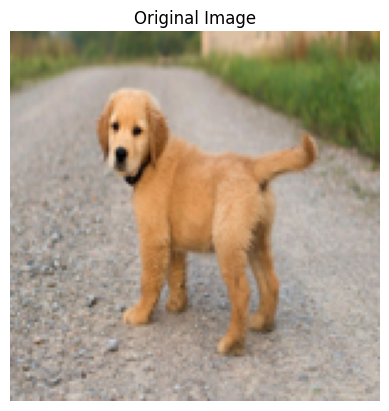

Classifying Test Image 2...
1/1 [==============================] - 3s 3s/step
1: pineapple (0.91)
2: acorn (0.05)
3: strawberry (0.01)


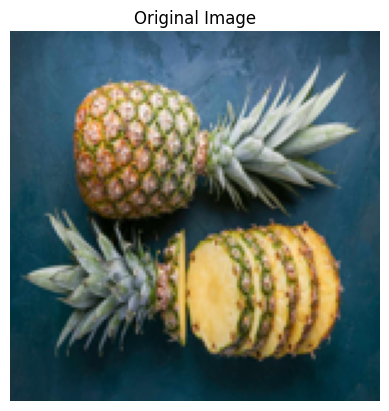

Classifying Test Image 3...
1/1 [==============================] - 0s 401ms/step
1: macaw (1.00)
2: lorikeet (0.00)
3: African_grey (0.00)


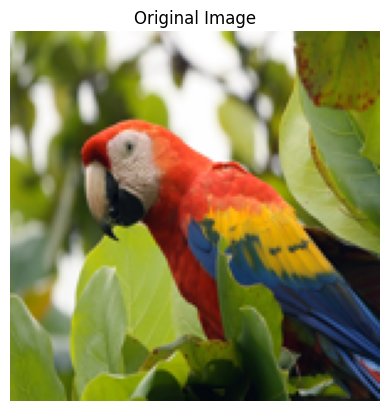

In [5]:
# Test images to Verify VGG19 Functionality
test_img_urls = ['https://miro.medium.com/v2/resize:fit:782/1*9i6MyZLPCue2nCInqPUIrQ.jpeg',
            'https://www.thespruceeats.com/thmb/2Pdkzy-BBOBG74eziXqSj3hwDeI=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/SES-history-of-the-pineapple-1807645-343418eb3b4c41b1b956d3c702550a07.jpg',
            'https://news.stanford.edu/__data/assets/image/0022/47542/Birds_culture-1-copy.jpeg']

# Iterating over the test images and processing each
for idx, img in enumerate(test_img_urls, start=1):
    img_tensor = load_image_as_array(img, url=True)  # Load image
    img_tensor = img_tensor / 255.  # Normalize pixel values
    print(f"Classifying Test Image {idx}...")  # Optional progress message
    verify_vgg19(img_tensor)  # Perform classification

The VGG19 model appears to be functioning as expected, accurately classifying the images with high confidence:
- The first image of the puppy was identified as a golden retriever with a 64% probability, which aligns with the expected result.
- The second image, depicting a pineapple, was classified with 91% certainty, demonstrating a high level of accuracy.
- The third image, featuring a macaw, was classified with 100% certainty, confirming the model's precise identification.

# **2. Multi-Channel Filter**
[4.0 points]
- Select a multi-channel filter (i.e., a feature) in a layer in which to analyze as part of a circuit. 
    - This should be a multi-channel filter in a "mid-level" portion of the network (that is, there are convolutional layers before and after this chosen layer). 
    - You might find using OpenAI microscope a helpful tool for selecting a filter to analyze without writing too much code: https://microscope.openai.com/models/
- Using image gradient techniques, find an input image that maximally excites this chosen multi-channel filter. 
    - General techniques are available from class: https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb
- Also send images of varying class (i.e., from ImageNet) through the network and track which classes of images most excite your chosen filter. 
- Give a hypothesis for what this multi-channel filter might be extracting. That is, what do you think its function is in the network? Give reasoning for your hypothesis. 
- If using code from another source or a LLM, you should heavily document the code so that I can grade your understanding of the code used. 

## **2.1 Selecting a Multi-Channel Filter**

In [6]:
# Load pre-trained VGG19 model without fully connected layers
model = VGG19(weights='imagenet', include_top=False)

# Freeze all convolutional layers (making them non-trainable)
for layer in model.layers:
    layer.trainable = False

# Print summary
print("### VGG19 Model Summary ###")
model.summary()

# Print layer details
print("\n### Layers and Output Shapes ###")
print("The following are the layers in the pre-trained VGG19 model and their output shapes (Trainable: False):")
print("-----------------------------------------------------------------------")

for i, layer in enumerate(model.layers):
    layer_name = layer.name
    layer_output_shape = layer.output.shape
    layer_trainable = layer.trainable
    print(f"Layer {i}: {layer_name} - Output Shape: {layer_output_shape} - Trainable: {layer_trainable}")

# Prints layer types for further understanding
print("\n### Layer Types and Descriptions ###")
for i, layer in enumerate(model.layers):
    layer_type = layer.__class__.__name__
    layer_name = layer.name
    print(f"Layer {i}: {layer_type} - {layer_name}")


### VGG19 Model Summary ###
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (Non

### Breakdown of Model Summary 
Our approach of using the pre-trained VGG19 model without the fully connected layers was chosen to leverage the learned features from the ImageNet dataset, which has a large variety of images and extensive labeling. This allows for effective transfer learning by using the convolutional layers of the VGG19 model, which are designed to extract general features such as edges, textures, and object parts from images. By excluding the fully connected layers through the parameter `include_top=False`, the model is stripped of its original classification head, making it more flexible for transfer learning or feature extraction tasks without the need for retraining the original layers.

The decision to freeze all the convolutional layers in the pre-trained VGG19 model ensures that the weights of these layers remain unchanged during the training of the new model. This is a standard practice in transfer learning, as the convolutional layers have already been trained on a vast and diverse dataset, allowing them to capture useful features for a wide range of tasks. By setting `trainable=False` for all the layers, the model avoids unnecessary retraining, saving both computational resources and time. Furthermore, freezing the layers helps prevent overfitting, as the already learned features are preserved, and the model focuses on adapting the top layers to the specific task at hand.

The reason for choosing to freeze all convolutional layers and focus on the summary of the model in this way is to aid in the process of selecting a multi-channel filter. By removing the fully connected layers and ensuring that the convolutional layers remain frozen, the model is set up to help isolate the key features needed for filter analysis. These convolutional layers have learned useful feature representations from a broad set of images, making them ideal for analyzing the activation of filters in subsequent layers, which is essential for understanding the multi-channel filter's role within the network.

Printing the model summary with `model.summary()` is crucial to confirm that the architecture has been loaded correctly and that the layers are configured as expected. The summary provides a detailed overview of the model, including the types of layers, output shapes, and the number of parameters, which is useful for verifying that the convolutional layers have been retained while the fully connected layers have been removed. Additionally, the printed layer details show the output shapes and trainability status of each layer. This step ensures that all convolutional layers are frozen and that the model is set up for feature extraction or transfer learning, without inadvertently modifying the pre-trained features.

The loop that prints the layer types further aids in understanding the architecture. By listing the specific types of layers used in the model, such as convolutional layers (`Conv2D`) and pooling layers (`MaxPooling2D`), it becomes easier to comprehend how the data flows through the network. This knowledge is essential when customizing the model in the future, especially if modifications are needed in the architecture or if certain layers need to be fine-tuned for a particular task. The transparency provided by these printed outputs helps ensure that the model is structured correctly and provides clarity on which parts of the model will be updated during training.

This approach to using a pre-trained model, freezing the convolutional layers, and then adding custom layers on top offers an efficient and computationally feasible way to apply the VGG19 architecture to new tasks. It leverages the strengths of transfer learning by using pre-trained weights for feature extraction, allowing the model to be adapted quickly to new domains with minimal additional computation. The clear, detailed examination of the model's architecture ensures that the setup is correct and that the model is ready for experimentation or further fine-tuning, especially in the context of selecting and analyzing multi-channel filters.

### Our Chosen Mid-Level Layer
The objective was to analyze mid-level multi-channel filters to identify a layer that balances complexity and abstraction, which would be ideal for examining intricate features without being too simple or too abstract. The goal was to select a layer that captures complex patterns, such as parts of objects or textures, without focusing on full object recognition.

### 1. **Initial Comparison of Layers**:
The following layers were considered for analysis:
- **`block3_conv1`**: Located in the third block, with **256 channels**. This layer captures relatively complex features at a mid-level of abstraction, such as parts of objects or textures.
- **`block4_conv1`**: Located in the fourth block, with **512 channels**. This layer captures more detailed and complex features, nearing high-level abstraction.
- **`block5_conv1`**: Located in the fifth and final block, with **512 channels**. This layer is more abstract, focusing on high-level object recognition.

### 2. **Criteria for Selection**:
To determine the most suitable layer, the following factors were taken into account:
- **Number of Channels**: Mid-level layers typically have a moderate number of channels, ranging from 256 to 512. High-level layers often have more channels and focus on full object recognition.
- **Complexity and Abstraction**: Mid-level layers are expected to capture complex features, such as parts of objects or textures, without being overly abstract or too simplistic.
- **Layer Position**: The position of the layer within the network affects the complexity of features it captures. Layers closer to the input focus on simpler features, while deeper layers capture more abstract features. For this analysis, a mid-level layer was preferred.

### 3. **Layer Breakdown**:
- **`block3_conv1` (256 channels)**:
  - **Strengths**: Captures mid-level complexity, including parts of objects or textures.
  - **Weaknesses**: May not capture enough higher-order features compared to deeper layers.
  - **Conclusion**: This layer is a strong candidate as it offers a good balance between simplicity and complexity, making it ideal for mid-level feature analysis.

- **`block4_conv1` (512 channels)**:
  - **Strengths**: Captures more detailed and complex features, such as object parts or finer patterns.
  - **Weaknesses**: The number of channels and its position in the network make this layer borderline between mid-level and high-level abstraction.
  - **Conclusion**: This layer is a good choice, but it begins to move towards high-level abstraction, making it less ideal for a mid-level analysis.

- **`block5_conv1` (512 channels)**:
  - **Strengths**: Captures abstract, high-level features and complex object parts.
  - **Weaknesses**: Primarily focuses on high-level recognition, making it less relevant for mid-level analysis.
  - **Conclusion**: This layer is more suited for high-level feature extraction and is not ideal for mid-level analysis.

### 4. **Final Decision**:
After evaluating the strengths and weaknesses of each layer, **`block3_conv1`** was selected as the most suitable layer for mid-level feature analysis:
- **Number of Channels**: With 256 channels, it offers a moderate level of complexity without being overly abstract.
- **Layer Position**: Positioned deep enough to capture meaningful features like object parts, but not so deep that it focuses on full object recognition.
- **Balance of Complexity and Abstraction**: This layer strikes an optimal balance for examining mid-level features.

### 5. **Outcome**:
**`block3_conv1`** was chosen as the optimal layer for visualizing mid-level multi-channel filters. This layer effectively captures complex patterns, such as parts of objects and textures, without delving into the abstract features seen in deeper layers like `block5_conv1`. It provides valuable insights into the functionality of the convolutional filters, making it a suitable choice for the analysis.


In [7]:
# Select layers to analyze
layer_names = ["block3_conv1", "block4_conv1", "block5_conv1"]  # Choose mid-level layers
layers = [model.get_layer(name).output for name in layer_names]

# Create a model that outputs activations from the selected layers
activation_model = Model(inputs=model.input, outputs=layers)

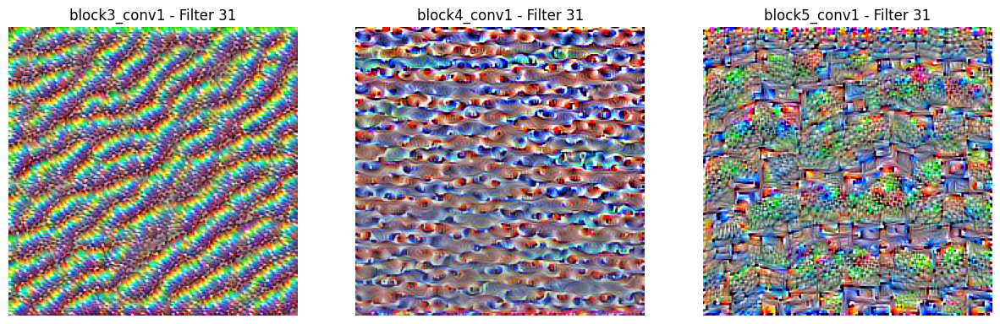

In [8]:
# Define function to generate image that maximizes filter activation
def generate_filter_visualization(layer_output, filter_index, iterations=30, learning_rate=10.0):
    input_img = tf.Variable(tf.random.uniform((1, 224, 224, 3)))  # Start with a random image

    def compute_loss():
        activation = layer_output(input_img)
        return -tf.reduce_mean(activation[:, :, :, filter_index])

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    for _ in range(iterations):
        with tf.GradientTape() as tape:
            loss = compute_loss()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])
    
    return input_img.numpy()[0]

# Define normalization function for visualization
def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.25
    img += 0.5
    img = np.clip(img, 0, 1)
    return img

# Choose a filter index to visualize
filter_index = 31  # Arbitrary

# Generate visualizations for each layer
fig, axes = plt.subplots(1, len(layer_names), figsize=(15, 5))
for i, (layer_name, layer_output) in enumerate(zip(layer_names, activation_model.outputs)):
    visualized_filter = generate_filter_visualization(Model(inputs=model.input, outputs=layer_output), filter_index)
    
    # Plot the result
    axes[i].imshow(deprocess_image(visualized_filter))
    axes[i].axis('off')
    axes[i].set_title(f'{layer_name} - Filter {filter_index}')

plt.show()


### Explanation of results here

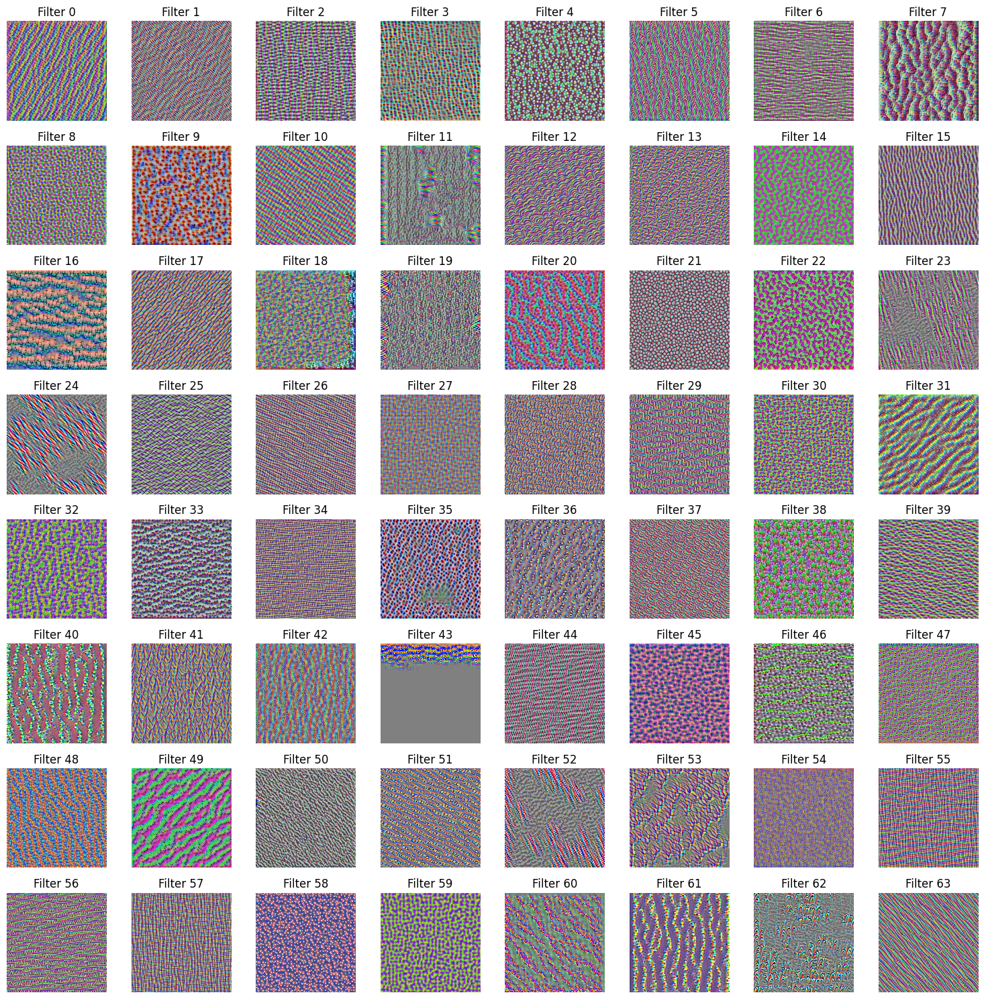

In [9]:
# Select only the block3_conv1 layer to continue with our analysis
layer_names = ["block3_conv1"]  # Focus only on the block3_conv1 layer
layers = [model.get_layer(name).output for name in layer_names]

# Create a model that outputs activations from the selected layer
activation_model = Model(inputs=model.input, outputs=layers)

# Define function to generate image that maximizes filter activation
def generate_filter_visualization(layer_output, filter_index, iterations=30, learning_rate=10.0):
    input_img = tf.Variable(tf.random.uniform((1, 224, 224, 3)))  # Start with a random image

    def compute_loss():
        activation = layer_output(input_img)
        return -tf.reduce_mean(activation[:, :, :, filter_index])

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    for _ in range(iterations):
        with tf.GradientTape() as tape:
            loss = compute_loss()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])
    
    return input_img.numpy()[0]

# Define normalization function for visualization
def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.25
    img += 0.5
    img = np.clip(img, 0, 1)
    return img

# Choose a range of filter indexes to visualize (for example, 0 to 63 if there are 64 filters)
filter_indexes = range(0, 64)  # Assuming block3_conv1 has 64 filters

# Create a grid to display multiple filters
fig, axes = plt.subplots(8, 8, figsize=(15, 15))  # Adjust grid size if necessary
axes = axes.flatten()

# Generate and display visualizations for each filter
for i, filter_index in enumerate(filter_indexes):
    visualized_filter = generate_filter_visualization(Model(inputs=model.input, outputs=activation_model.outputs[0]), filter_index)
    
    # Plot the result for each filter
    axes[i].imshow(deprocess_image(visualized_filter))
    axes[i].axis('off')
    axes[i].set_title(f'Filter {filter_index}')

plt.tight_layout()
plt.show()


### Selection and Analysis of Filter 31 in the block3_conv1 Layer

The analysis begins by selecting the **block3_conv1** layer from the VGG19 model. This layer is considered a *mid-level* layer because it sits between the early, low-level convolutional layers and the deeper, more abstract layers in the network. Mid-level layers, such as block3_conv1, are ideal for capturing both high-level semantic information and detailed features that are not as abstract as those in the deeper layers. Specifically, block3_conv1 is known to focus on more intricate patterns and textures in images, which makes it a valuable layer for analysis when investigating feature detection in a convolutional neural network (CNN).

The **block3_conv1** layer consists of 64 filters, each of which responds to specific patterns or features in the input images. From these, **filter 31** was selected for closer examination due to its distinctive activation pattern, which appears to capture fine details, such as ridges and textures. Upon visualizing all the filters in the block3_conv1 layer, filter 31 stood out for its level of detail, suggesting that it is particularly sensitive to smaller, low-to-mid level features, such as intricate texture or edge-like structures. 

To further explore what this filter is detecting, a **filter visualization** was generated using **gradient ascent**. Gradient ascent is a method that modifies an image in such a way that it maximizes the activation of a specific filter. By iteratively updating the image to increase the filter's response, the process reveals the types of features that trigger the highest activation from filter 31. This technique helps to visualize what the filter is specifically "looking for" in the input image.

The visualization of filter 31 produced an image with textures and details that are indicative of fine-grained patterns, such as ridges or lines. These patterns suggest that filter 31 might be especially sensitive to objects or surfaces that exhibit fine, textured characteristics, like certain types of fabric, rough surfaces, or finely detailed objects. The resulting image makes it evident that filter 31 plays a significant role in detecting these finer details.

By comparing filter 31 to the other filters in the block3_conv1 layer, it became clear that this particular filter is highly effective at capturing detailed textures. This makes it an ideal candidate for further investigation into the model's ability to detect texture-related features or its role in fine-grained object recognition. Understanding filter 31's functionality is crucial for interpreting the VGG19 model’s capacity to recognize and process detailed image features, which can be useful for tasks such as texture classification or surface analysis.

In conclusion, filter 31’s ability to capture detailed textures and fine-grained patterns makes it a key feature for understanding the network's behavior, especially in tasks requiring the recognition of subtle surface details. Further analysis of this filter will provide valuable insights into the model's feature-detection capabilities and its effectiveness in handling intricate image patterns.

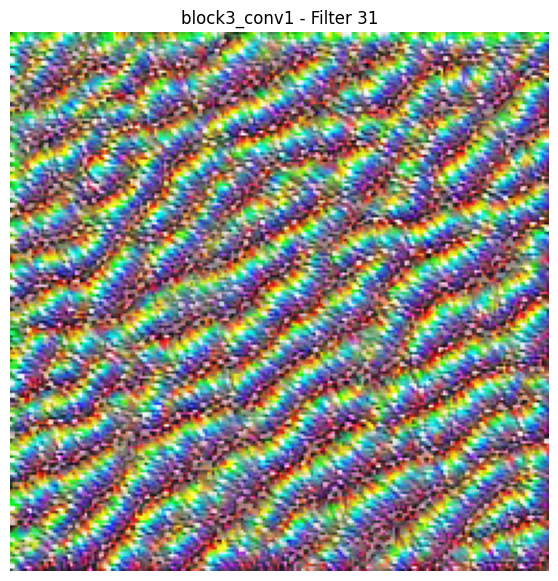

In [10]:
# Select only the block3_conv1 layer to continue with our analysis
chosen_layer = ["block3_conv1"]  # Focus only on the block3_conv1 layer
layers = [model.get_layer(name).output for name in chosen_layer]

# Create a model that outputs activations from the selected layer
activation_model = Model(inputs=model.input, outputs=layers)

# Define function to generate image that maximizes filter activation
def generate_filter_visualization(layer_output, filter_index, iterations=30, learning_rate=10.0):
    input_img = tf.Variable(tf.random.uniform((1, 224, 224, 3)))  # Start with a random image

    def compute_loss():
        activation = layer_output(input_img)
        return -tf.reduce_mean(activation[:, :, :, filter_index])

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    for _ in range(iterations):
        with tf.GradientTape() as tape:
            loss = compute_loss()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])
    
    return input_img.numpy()[0]

# Define normalization function for visualization
def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.25
    img += 0.5
    img = np.clip(img, 0, 1)
    return img

# Chosen Filter
chosen_filter = 31  # Filter 31 was chosen for its detailed feature detection

# Generate visualization for filter 31
fig, ax = plt.subplots(figsize=(7, 7))
visualized_filter = generate_filter_visualization(Model(inputs=model.input, outputs=activation_model.outputs[0]), chosen_filter)

# Plot the result
ax.imshow(deprocess_image(visualized_filter))
ax.axis('off')
ax.set_title(f'block3_conv1 - Filter {chosen_filter}')

plt.show()


### Final Selection of Layer and Filter for Analysis

After a thorough evaluation of the available filters in the VGG19 model's **block3_conv1** layer, **filter 31** has been selected for further analysis. This selection is based on several key factors that make filter 31 stand out among the 64 filters in this mid-level layer.

The **block3_conv1** layer was chosen because it represents a mid-level stage in the network, capturing a balance between low-level features (such as edges and textures) and higher-level abstract representations. Mid-level layers like block3_conv1 are ideal for understanding the network's ability to detect complex patterns without being too abstract or too fine-grained. These filters can reveal essential features of an image, such as textures, patterns, and other intermediate details that are crucial for recognizing objects and scenes.

**Filter 31** was specifically selected because of its ability to capture highly detailed features, such as ridges and textured patterns. Upon visualizing the filter activations, filter 31 consistently showed a preference for fine-grained, texture-related features, making it particularly suited for tasks that require precise detail recognition, such as texture classification or fine-grained object detection. The visualizations revealed that this filter is sensitive to intricate patterns, which suggests its role in detecting fine, subtle structures within images.

Moving forward, the focus will be on further exploring **filter 31** in the **block3_conv1** layer. This will involve generating more in-depth visualizations and examining how this filter reacts to various types of input images. The insights gained from this filter’s activation patterns will provide a clearer understanding of its role within the VGG19 model, particularly in recognizing detailed textures and surface features.

By choosing **filter 31** from the **block3_conv1** layer, the analysis will delve into the model’s capacity for detecting and processing detailed textural information, which is vital for applications such as object recognition, texture-based classification, and fine-grained image analysis.

## **2.2 Image Gradient Techniques**

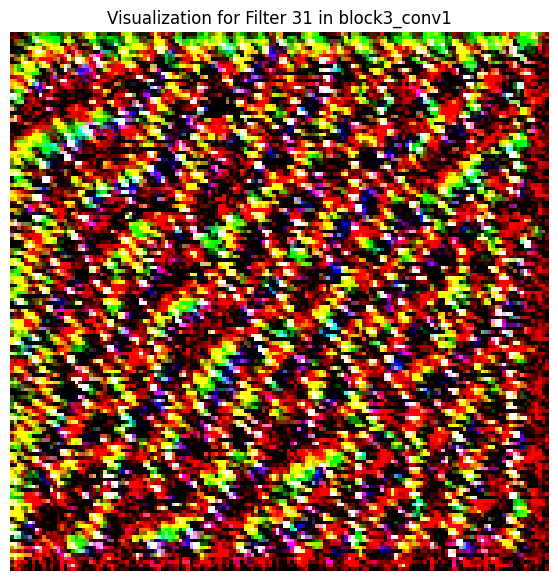

In [11]:
# Define the layer and filter to focus on
chosen_layer = "block3_conv1"  # Focus only on the block3_conv1 layer
chosen_filter = 31  # Filter 31 chosen for its detailed feature detection

# Build a new model that outputs the activations for the chosen layer
layer_output = model.get_layer(chosen_layer).output
activation_model = Model(inputs=model.input, outputs=layer_output)

# Function to preprocess and prepare image for visualization
def prepare_image_for_display(img, norm_type='std'):
    """Pre-process image for display after generating maximized filter"""
    if norm_type == 'std':
        img -= img.mean()
        img /= img.std() + 1e-5
    # Normalize pixel values to the range [0, 1] for display
    img = np.clip(img, 0, 1)  # Ensure pixel values are within [0, 1]
    return img

# Starter code's gradient ascent method to generate filter visualization
def generate_pattern(layer_name, filter_index, size=150, iterations=40, eta=1.0):
    # Isolate the layer for which activations will be maximized
    layer_output = model.get_layer(layer_name).output
    new_model = Model(inputs=model.input, outputs=layer_output)

    # Start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    I_start = tf.Variable(input_img_data, name='image_var', dtype='float64')
    I = preprocess_input(I_start)  # Preprocess image once

    # Run gradient ascent for 'iterations' steps
    for i in range(iterations):
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(I)
            model_vals = new_model(I)  # Get the activations from the chosen layer
            filter_output = tf.reduce_mean(model_vals[:, :, :, filter_index])  # Maximize the selected filter's activation

        # Compute the gradient of the output with respect to the input image
        grad_fn = tape.gradient(filter_output, I)

        # Normalize the gradient to avoid large changes
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)
        
        # Apply the gradient to the image (gradient ascent step)
        I += grad_fn * eta  # Update the image
    
    # Return the processed image ready for display
    return prepare_image_for_display(I.numpy(), norm_type='std')

# Generate filter maximization for the chosen filter
generated_image = generate_pattern(chosen_layer, chosen_filter, size=150, iterations=40, eta=1.0)

# Plot the result
fig, ax = plt.subplots(figsize=(7, 7))

# Remove the batch dimension (the first dimension) to get a shape of (150, 150, 3)
generated_image = generated_image.squeeze()  # This removes the singleton dimension (1, 150, 150, 3) -> (150, 150, 3)

# Ensure that the image is in the proper range for display
generated_image = np.clip(generated_image, 0, 1)  # Ensure pixel values are within [0, 1]

# Plot the image
ax.imshow(generated_image)  # Use the generated image directly
ax.axis('off')
ax.set_title(f'Visualization for Filter {chosen_filter} in {chosen_layer}')
plt.show()



The code begins by defining the layer and filter to focus on, specifically the `block3_conv1` layer and filter 31. The `block3_conv1` layer is chosen because it is a convolutional layer located in the middle of the network, capturing abstract features such as textures and shapes. Filter 31 is selected because it displays detailed feature extraction capabilities, which are useful for understanding how the network interprets more complex patterns.

Next, the code constructs a new model that outputs the activations of the selected layer (`block3_conv1`). This is achieved using the line:

```python
layer_output = model.get_layer(chosen_layer).output
activation_model = Model(inputs=model.input, outputs=layer_output)
```

Here, the `get_layer()` method is used to access the chosen layer in the pre-trained model, and a new `Model` is created to output the activations from that layer. This new model enables the extraction of activations for the input image, which are then used to understand how the chosen filter responds to various inputs.

The code then defines the function `prepare_image_for_display`, which processes the image for visualization. The purpose of this function is to normalize the pixel values to make the image suitable for display. Specifically, if the 'std' normalization type is chosen, the function subtracts the mean of the image and divides by its standard deviation, ensuring that the pixel values are standardized. This preprocessing step is important for making the visualized image clearer and more interpretable. Additionally, it clips the pixel values to ensure that they stay within the range [0, 1], which is the valid range for image data in visualization libraries.

The core part of the code is the `generate_pattern` function, which implements the gradient ascent algorithm to create an image that maximally excites the selected filter. Gradient ascent is a technique where the input image is modified iteratively to increase the activation of a specific filter. This process involves several steps:

```python
input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
I_start = tf.Variable(input_img_data, name='image_var', dtype='float64')
```

Here, the code initializes a random image `input_img_data` with pixel values between 128 and 148, with the shape `(1, size, size, 3)`. The image is then wrapped in a `tf.Variable` to allow it to be updated during the gradient ascent process.

```python
I = preprocess_input(I_start)
```

The input image is preprocessed using `preprocess_input`, a function that ensures the image is in the appropriate format for feeding into the model. This is often a step to normalize or scale input images to match the preprocessing used during model training.

The gradient ascent process is then performed within a loop, where the activations are computed, the gradient of the activation with respect to the input image is calculated, and the image is updated:

```python
for i in range(iterations):
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(I)
        model_vals = new_model(I)  # Get the activations from the chosen layer
        filter_output = tf.reduce_mean(model_vals[:, :, :, filter_index])  # Maximize the selected filter's activation
```

Each iteration of this loop involves the calculation of the activations for the image `I` by passing it through the `new_model`. The `tape.watch(I)` ensures that the gradient can be computed with respect to the image itself. The code then calculates the mean activation of the chosen filter (`filter_index`), which will be maximized through gradient ascent.

```python
grad_fn = tape.gradient(filter_output, I)
```

After calculating the activations, the gradient of the filter's output with respect to the image is computed using `tape.gradient`. This tells us how to modify the image to increase the activation of the chosen filter.

```python
grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)
I += grad_fn * eta
```

To stabilize the update and prevent large, unmanageable gradients, the gradient is normalized by dividing it by its L2 norm (the square root of the mean squared gradient). The image is then updated using gradient ascent: the image `I` is incremented by the gradient, scaled by a learning rate `eta`.

After the gradient ascent iterations are completed, the image is processed using the `prepare_image_for_display` function to ensure that the pixel values are suitable for visualization. The final processed image is returned from `generate_pattern`.

Finally, the code plots the generated image using `matplotlib`:

```python
fig, ax = plt.subplots(figsize=(7, 7))
generated_image = generated_image.squeeze()  # Remove batch dimension
generated_image = np.clip(generated_image, 0, 1)  # Ensure pixel values are within [0, 1]
ax.imshow(generated_image)  # Display the image
ax.axis('off')
ax.set_title(f'Visualization for Filter {chosen_filter} in {chosen_layer}')
plt.show()
```

The image is first squeezed to remove the batch dimension (since the input image has shape `(1, size, size, 3)`), resulting in the final shape of `(size, size, 3)`. The pixel values are then clipped again to ensure they fall within the valid range for display. Finally, the image is displayed using `imshow()`, and the axes are removed for a clean presentation. The title indicates which filter and layer the visualization corresponds to.

This code demonstrates our approach for generating a filter maximization visualization, utilizing gradient ascent to create an input image that maximally activates a particular filter in a convolutional layer. It follows standard practices for neural network visualization and ensures that the generated image is both informative and visually interpretable.


## **2.3 Sending Images of Varying Classes Through the Network**

In [12]:
# URL for the ImageNet class index JSON
url = 'https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json'

# Download the file
response = requests.get(url)

# Save the JSON file locally
with open('imagenet_class_index.json', 'wb') as f:
    f.write(response.content)

print("ImageNet class index JSON file downloaded successfully!")


ImageNet class index JSON file downloaded successfully!


In [13]:
# Load the ImageNet class labels from the downloaded JSON file
with open('imagenet_class_index.json', 'r') as f:
    class_idx = json.load(f)

# Convert the loaded data to a dictionary mapping synset ID to class name
synset_to_classname = {v[0]: v[1] for k, v in class_idx.items()}  # Maps synset ID -> class name

# Test it
print(synset_to_classname["n01440764"])  # Expected output: 'tench'


tench


In [14]:
print(synset_to_classname["n02123159"])  # Should output 'tiger_cat'
print(synset_to_classname["n03394916"])  # Should output 'French_horn'


tiger_cat
French_horn


1/1 [==============================] - 0s 365ms/step
Prediction softmax shape: (1, 1000)
1/1 [==============================] - 0s 220ms/step
Prediction softmax shape: (1, 1000)
1/1 [==============================] - 0s 217ms/step
Prediction softmax shape: (1, 1000)


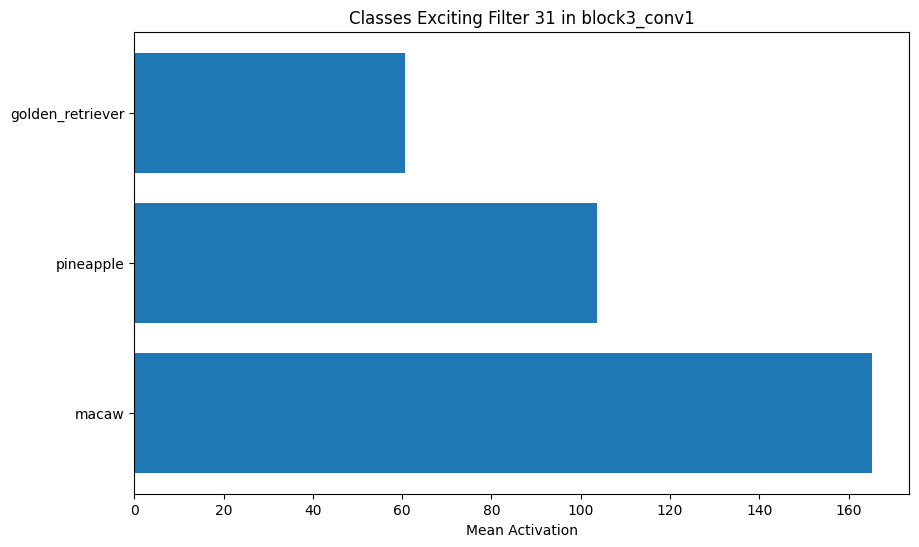

In [15]:
# Ensure we use the full VGG19 model for classification (not just feature extraction)
full_model = VGG19(weights="imagenet")  # Load pre-trained model with full classification head

# Define the layer and filter to focus on
chosen_layer = "block3_conv1"  # Layer we want to extract activations from
chosen_filter = 31  # The chosen filter index

# Build a new model that outputs the activations for the chosen layer
layer_output = full_model.get_layer(chosen_layer).output
activation_model = Model(inputs=full_model.input, outputs=layer_output)

# Function to load an image from a URL
def load_image_from_url(image_url):
    response = requests.get(image_url)
    img = image.load_img(BytesIO(response.content), target_size=(224, 224))  # Resize to VGG19 input size
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return preprocess_input(img_array)  # Preprocess the image for VGG19

# Function to get the activation of the chosen filter for a given image
def get_filter_activation(image_url, chosen_filter):
    img_preprocessed = load_image_from_url(image_url)
    activations = activation_model.predict(img_preprocessed)  # Get activations
    filter_activation = activations[0, :, :, chosen_filter]  # Extract activations for the chosen filter
    return np.mean(filter_activation)  # Return the average activation for this filter

# List of image URLs for testing
image_urls = [
    'https://miro.medium.com/v2/resize:fit:782/1*9i6MyZLPCue2nCInqPUIrQ.jpeg',
    'https://www.thespruceeats.com/thmb/2Pdkzy-BBOBG74eziXqSj3hwDeI=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/SES-history-of-the-pineapple-1807645-343418eb3b4c41b1b956d3c702550a07.jpg',
    'https://news.stanford.edu/__data/assets/image/0022/47542/Birds_culture-1-copy.jpeg'
]

# Store the activations for each class
activations_per_class = {}

# Process each image and track the activation for filter 31
for image_url in image_urls:
    activation_value = get_filter_activation(image_url, chosen_filter)

    # Get the final predictions from the model (softmax output)
    img_preprocessed = load_image_from_url(image_url)
    preds = full_model.predict(img_preprocessed)  # Get predictions from FULL model

    # Ensure we get the correct class index
    predicted_class_index = np.argmax(preds)  # Corrected: No need to convert to str

    # Debug: Print the prediction shape
    print("Prediction softmax shape:", preds.shape)  # Should be (1, 1000)

    # Get the synset ID corresponding to the predicted class index
    synset_id = list(synset_to_classname.keys())[predicted_class_index]

    # Map predicted synset ID to ImageNet class name
    predicted_class = synset_to_classname.get(synset_id, "Unknown Class")

    if predicted_class == "Unknown Class":
        print(f"Warning: Predicted synset ID {synset_id} not found in synset_to_classname!")
        continue  # Skip this iteration

    if predicted_class not in activations_per_class:
        activations_per_class[predicted_class] = []

    activations_per_class[predicted_class].append(activation_value)

# Now let's visualize which classes excite the filter the most
class_activations = {class_name: np.mean(activations) for class_name, activations in activations_per_class.items()}

# Sort classes by activation strength
sorted_class_activations = sorted(class_activations.items(), key=lambda x: x[1], reverse=True)

# Plot the results
plt.figure(figsize=(10, 6))
class_names = [item[0] for item in sorted_class_activations]
activation_values = [item[1] for item in sorted_class_activations]

plt.barh(class_names, activation_values)
plt.xlabel("Mean Activation")
plt.title(f"Classes Exciting Filter {chosen_filter} in {chosen_layer}")
plt.show()




In [16]:
# Kaggle Dataset Mini-ImageNet
# Download the dataset
# path = kagglehub.dataset_download("ifigotin/imagenetmini-1000")

# print("Path to dataset files:", path)

In [17]:
# Path to the locally downloaded dataset
dataset_directory = 'C:/Users/Juan Dominguez/.cache/kagglehub/datasets/ifigotin/imagenetmini-1000/versions/1/imagenet-mini'

Top Classes:
dugong: 242.6045684814453
great_white_shark: 224.27420043945312
tiger_shark: 213.0269012451172
green_lizard: 212.3607940673828
rock_beauty: 202.96530151367188
long-horned_beetle: 200.37600708007812
jellyfish: 195.78128051757812
coral_reef: 193.6988983154297
scuba_diver: 186.28173828125
orange: 181.80819702148438

Top Images:
long-horned_beetle - ILSVRC2012_val_00041506.JPEG: 464.71356201171875
neck_brace - ILSVRC2012_val_00033894.JPEG: 456.1957092285156
barracouta - ILSVRC2012_val_00000312.JPEG: 423.2679443359375
jellyfish - ILSVRC2012_val_00007283.JPEG: 380.298583984375
great_white_shark - ILSVRC2012_val_00019409.JPEG: 339.8894348144531
screwdriver - ILSVRC2012_val_00014997.JPEG: 339.7986755371094
whistle - ILSVRC2012_val_00000497.JPEG: 331.44891357421875
great_white_shark - ILSVRC2012_val_00027514.JPEG: 327.5295104980469
rule - ILSVRC2012_val_00022379.JPEG: 321.34124755859375
microphone - ILSVRC2012_val_00013495.JPEG: 306.763427734375


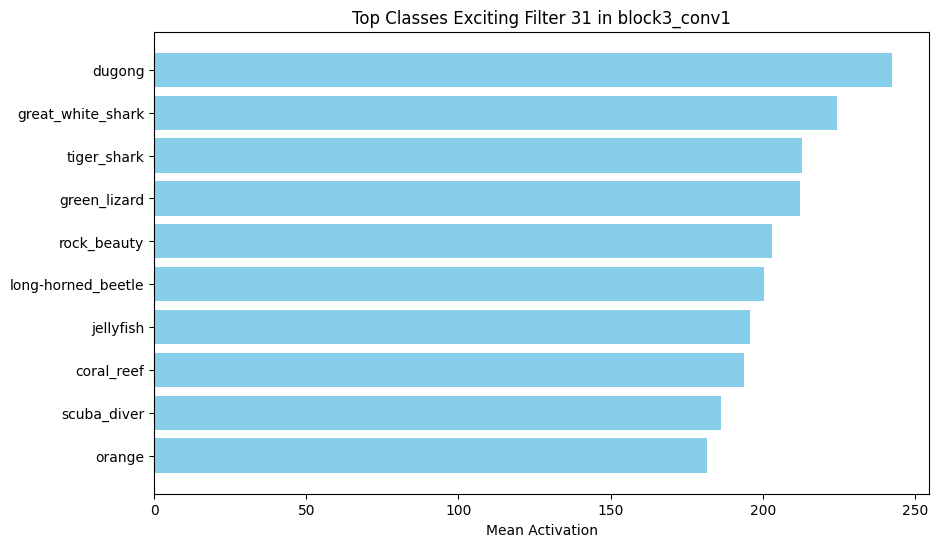

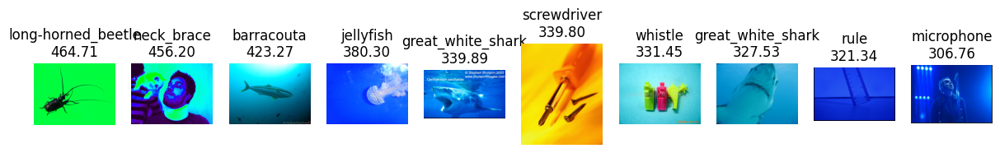

In [18]:
# Load the full VGG19 model with pre-trained ImageNet weights
full_model = VGG19(weights="imagenet")

# Define the layer and filter to analyze
chosen_layer = "block3_conv1"
chosen_filter = 31

# Build a new model that outputs the activations for the chosen layer
layer_output = full_model.get_layer(chosen_layer).output
activation_model = Model(inputs=full_model.input, outputs=layer_output)

# Define dataset directory
dataset_directory = 'C:/Users/Juan Dominguez/.cache/kagglehub/datasets/ifigotin/imagenetmini-1000/versions/1/imagenet-mini'
train_dir = os.path.join(dataset_directory, 'train')
val_dir = os.path.join(dataset_directory, 'val')

# Limit the number of images per class
NUM_IMAGES_PER_CLASS = 50  # Adjust based on memory availability
images_dict = {}

# Function to load images from directories
def load_images_from_directory(directory, num_samples=NUM_IMAGES_PER_CLASS):
    """Load a limited number of images per class, mapping synset IDs to human-readable class names."""
    for folder_name in os.listdir(directory):  # Folder_name is synset ID (e.g., "n01440764")
        folder_path = os.path.join(directory, folder_name)

        if not os.path.isdir(folder_path):
            continue  # Skip if not a folder

        image_files = os.listdir(folder_path)
        random.shuffle(image_files)  # Shuffle for randomness

        folder_images = []
        for image_name in image_files[:num_samples]:  # Only load a subset
            image_path = os.path.join(folder_path, image_name)

            try:
                # Load and preprocess image
                img = image.load_img(image_path, target_size=(224, 224))
                img_array = image.img_to_array(img)
                img_array = np.expand_dims(img_array, axis=0)
                folder_images.append([image_name, preprocess_input(img_array)])
            except Exception as e:
                print(f"Skipping {image_path}: {e}")
                continue

        if folder_images:
            class_name = synset_to_classname.get(folder_name, folder_name).lower()  # Convert synset ID to class name
            images_dict[class_name] = folder_images  # Store using class name

# Load a subset of images from train and validation directories
load_images_from_directory(train_dir)
load_images_from_directory(val_dir)

# Function to get activations for an image
def get_filter_activation_for_image(image_array, filter_idx):
    activations = activation_model.predict(image_array, verbose=0)  # Disable verbose logging
    return activations[0, :, :, filter_idx]  # Extract activations for the chosen filter

# Function to find the top classes and images exciting the filter
def find_top_classes_and_images(filter_idx, top_n=10):
    """Processes the dataset to determine which classes/images activate the filter the most."""
    class_results = []
    image_results = []

    # Process each class and its images
    for class_name, folder_images in images_dict.items():
        class_activations = []

        for image_name, image_array in folder_images:
            activation = get_filter_activation_for_image(image_array, filter_idx)
            mean_activation = np.mean(activation)

            # Store activation per image
            image_results.append([class_name, image_name, mean_activation])
            class_activations.append(mean_activation)

        # Calculate mean activation for the class
        if class_activations:
            class_mean_activation = np.mean(class_activations)
            class_results.append([class_name, class_mean_activation])

    # Sort by activation values
    class_results.sort(key=lambda x: x[1], reverse=True)
    image_results.sort(key=lambda x: x[2], reverse=True)

    return class_results[:top_n], image_results[:top_n]

# Find top classes and images exciting the chosen filter
top_classes, top_images = find_top_classes_and_images(chosen_filter, top_n=10)

# Display the top classes and images
print("Top Classes:")
for class_name, activation in top_classes:
    print(f"{class_name}: {activation}")

print("\nTop Images:")
for class_name, image_name, activation in top_images:
    print(f"{class_name} - {image_name}: {activation}")

# Plot results
class_names = [item[0] for item in top_classes]
activation_values = [item[1] for item in top_classes]

plt.figure(figsize=(10, 6))
plt.barh(class_names, activation_values, color='skyblue')
plt.xlabel("Mean Activation")
plt.title(f"Top Classes Exciting Filter {chosen_filter} in {chosen_layer}")
plt.gca().invert_yaxis()  # Invert y-axis for readability
plt.show()

# Function to display the top N images exciting the filter
def show_top_images(image_results, dataset_dir, num_images=10):
    """Displays the top N images that maximally excite the chosen filter."""
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i, (class_name, image_name, activation) in enumerate(image_results[:num_images]):
        # Find the synset ID (folder name) for the class
        synset_id = next((k for k, v in synset_to_classname.items() if v == class_name), None)

        if synset_id is None:
            print(f"Warning: No synset ID found for class '{class_name}', skipping image display.")
            continue

        image_path = os.path.join(dataset_dir, "val", synset_id, image_name)

        try:
            img = mpimg.imread(image_path)  # Load image
            axes[i].imshow(img)
            axes[i].axis("off")
            axes[i].set_title(f"{class_name}\n{activation:.2f}")
        except Exception as e:
            print(f"Error displaying {image_path}: {e}")
    
    plt.show()

# Show top 5 images
show_top_images(top_images, dataset_directory, num_images=10)

### Top Classes

In [19]:
# Convert the top classes and activation values into a pandas DataFrame
top_classes_df = pd.DataFrame(top_classes, columns=["Class Name", "Mean Activation"])

# Format the activation values to 2 decimal places
top_classes_df['Mean Activation'] = top_classes_df['Mean Activation'].round(2)

# Convert DataFrame to a list of lists (for tabulate compatibility)
table_data = top_classes_df.values.tolist()

# Create a table with separators using tabulate
table = tabulate(table_data, headers=top_classes_df.columns, tablefmt="grid", floatfmt=".2f")

# Print the table
print(table)

+--------------------+-------------------+
| Class Name         |   Mean Activation |
+====================+===================+
| dugong             |            242.60 |
+--------------------+-------------------+
| great_white_shark  |            224.27 |
+--------------------+-------------------+
| tiger_shark        |            213.03 |
+--------------------+-------------------+
| green_lizard       |            212.36 |
+--------------------+-------------------+
| rock_beauty        |            202.97 |
+--------------------+-------------------+
| long-horned_beetle |            200.38 |
+--------------------+-------------------+
| jellyfish          |            195.78 |
+--------------------+-------------------+
| coral_reef         |            193.70 |
+--------------------+-------------------+
| scuba_diver        |            186.28 |
+--------------------+-------------------+
| orange             |            181.81 |
+--------------------+-------------------+


### Top Images

In [20]:
# Convert top_images to a DataFrame for easy formatting
top_images_df = pd.DataFrame(top_images, columns=['Class Name', 'Image Name', 'Activation'])

# Format the activation values to 2 decimal places
top_images_df['Activation'] = top_images_df['Activation'].round(2)

# Convert DataFrame to a list of lists (for tabulate compatibility)
table_data = top_images_df.values.tolist()

# Create a table with separators using tabulate
table = tabulate(table_data, headers=top_images_df.columns, tablefmt="grid", floatfmt=".2f")
print(table)

+--------------------+------------------------------+--------------+
| Class Name         | Image Name                   |   Activation |
+====================+==============================+==============+
| long-horned_beetle | ILSVRC2012_val_00041506.JPEG |       464.71 |
+--------------------+------------------------------+--------------+
| neck_brace         | ILSVRC2012_val_00033894.JPEG |       456.20 |
+--------------------+------------------------------+--------------+
| barracouta         | ILSVRC2012_val_00000312.JPEG |       423.27 |
+--------------------+------------------------------+--------------+
| jellyfish          | ILSVRC2012_val_00007283.JPEG |       380.30 |
+--------------------+------------------------------+--------------+
| great_white_shark  | ILSVRC2012_val_00019409.JPEG |       339.89 |
+--------------------+------------------------------+--------------+
| screwdriver        | ILSVRC2012_val_00014997.JPEG |       339.80 |
+--------------------+------------

## **2.4 Hypothesis for Multi-Channel Extraction**

Filter 31 in the block3_conv1 layer of VGG19 appears to function as a detector for elongated structures, fine textures, and high-frequency details present in both natural and artificial objects. **Our hypothesis is that this filter is primarily extracting mid-level textural and structural patterns, particularly those related to ridges, linear forms, and intricate surface textures, which contribute to object differentiation.** The activation patterns observed across various classes suggest that this filter is particularly sensitive to features such as ridges, linear patterns, and surface textures. Many of the most highly activated images, including those of the long-horned beetle, barracouta, great white shark, and jellyfish, contain distinct elongated structures or intricate surface textures. These characteristics suggest that the filter plays a role in identifying fine-grained details that contribute to the network’s ability to distinguish between objects with complex surface features. Additionally, the presence of screwdrivers, whistles, and neck braces among the highest-activated images further supports the idea that this filter responds strongly to cylindrical and structured objects, reinforcing its role in detecting continuous linear forms and ridged surfaces.

The mean activation data further supports our hypothesis, as classes such as dugong, tiger shark, green lizard, and coral reef also rank highly. Many of these classes exhibit unique surface textures, including scaly, ridged, or smooth but structured patterns, which could indicate that Filter 31 is tuned to recognize features that help in differentiating between various textures rather than purely relying on broader shape recognition. The consistent presence of marine life and insects, along with structured man-made objects, suggests that this filter captures mid-level abstractions that go beyond simple edge detection but do not yet reach full object recognition. This aligns with the function of block3_conv1, which operates as a mid-level convolutional layer responsible for detecting intermediate-level visual features that contribute to the broader hierarchical understanding of an image.

The activation patterns of this filter highlight its significance in feature extraction, particularly in identifying intricate textural and shape-based cues. By responding strongly to both organic structures, such as shark skin and insect exoskeletons, and mechanical objects with distinct contours, the filter likely enhances the model’s ability to differentiate objects based on their surface detail and form continuity. This function is critical for fine-grained recognition tasks where distinguishing objects requires a nuanced understanding of micro-patterns and texture variations rather than solely relying on broader shape structures. As a result, Filter 31 contributes to the model’s ability to generalize across different categories by focusing on features that persist across multiple object types, making it particularly effective in identifying elongated, textured, and structured elements in images.

# **3. Analyzing Each Channel of the Multi-Channel Filter**
[4.0 points]
-  Analyze each channel of the multi-channel filter to better understand how this might form a circuit (i.e., the weights of the filter). 
    - That is, visualize the convolutional filter (one channel at a time) between the input activations and the current activation to understand which inputs make up a circuit. 
    - You should avoid filter channels that are mostly "zero" coefficients. 
    - These are not influential for the circuit. 
    - One method of doing this is given below:
- Extract the filter coefficients for each input activation to that multi-channel filter. Note: If the multi-channel filter is 5x5 with an input channel size of 64, then this extraction will result in 64 different single channel filters, each of size 5x5. 
- Keep the top ten sets of inputs with the "strongest" weights. For now, you can use the L2 norm of each input filter as a measure of strength. Visualize these top ten filters. 
- For these ten strongest input filters, categorize each as "mostly inhibitory" or "mostly excitatory." That is, does each filter consist of mostly negative or mostly positive coefficients? 

## **3.1 Extracting the Layer & Filter Weights**

In [21]:
# Load VGG19 model
model = VGG19(weights='imagenet')

# Select the target convolutional layer and filter index
layer_name = 'block3_conv1'  # Target layer
filter_idx = 31  # Target filter

# Extract layer and its weights
keras_layer = model.get_layer(layer_name)
weights_list = keras_layer.get_weights()
filters = weights_list[0]  # Shape: (3, 3, input_channels, output_channels)
biases = weights_list[1]

# Extract filter dimensions
filter_shape = filters.shape  # (kernel_size, kernel_size, input_channels, output_channels)
input_channels = filter_shape[2]  # Number of input channels

print(f'{layer_name} filter coefficients shape: {filters.shape} (kernel_size x kernel_size x input_channels x output_channels)')

block3_conv1 filter coefficients shape: (3, 3, 128, 256) (kernel_size x kernel_size x input_channels x output_channels)


The block of code above is crucial for analyzing how a convolutional filter operates within the VGG19 model, particularly focusing on the 31st filter in the block3_conv1 layer. The code first initializes the VGG19 model with pre-trained ImageNet weights, which allows us to analyze filters that have already learned feature representations from a vast dataset of images (Simonyan & Zisserman, 2014). The layer of interest, `block3_conv1`, is a convolutional layer in the third block of VGG19, responsible for detecting intermediate-level features such as textures and shapes (Zeiler & Fergus, 2014). By selecting a specific filter (filter index 31), we can isolate its behavior and examine how it interacts with input activations.

Once the layer is retrieved, the code extracts its weights (filter coefficients) and biases. These weights define how the filter processes input feature maps (Goodfellow, Bengio, & Courville, 2016). The extracted weight tensor has dimensions (3,3,128,256), meaning each filter in this layer operates using a 3×3 kernel applied to 128 input channels, generating 256 different feature maps. This is a critical insight because each convolutional filter does not act on raw image pixels but rather on the feature maps produced by the previous layer (Olah, Mordvintsev, & Schubert, 2017). The filter we are analyzing (filter 31) is not a single 3×3 matrix but a collection of 128 different 3×3 matrices, each corresponding to a different input channel.

The significance of extracting the filter coefficients is that it allows us to determine which input channels contribute the most to the activation of this filter. Since not all input channels have the same level of influence, the analysis that follows will identify the most influential channels by computing the L2 norm of each 3×3 weight matrix (LeCun et al., 1998). This helps distinguish between strong and weak connections, much like analyzing a circuit where some components play a more critical role in signal flow (Krizhevsky, Sutskever, & Hinton, 2012). The print statement confirming the shape of the filter tensor reinforces this multi-channel nature, highlighting that filter 31 is formed by contributions from 128 different channels, each processed by its own 3×3 matrix.

Understanding these filter coefficients is essential for interpreting what kind of features this filter is detecting. If certain weight matrices within filter 31 have strong positive values, they amplify specific features, while strongly negative values indicate suppression of certain patterns (Zeiler & Fergus, 2014). This behavior is analogous to how an electrical circuit selectively strengthens or inhibits signals based on the components involved. The extracted filter weights provide a foundation for deeper analysis, such as determining which channels are most influential, visualizing the strongest filters, and categorizing them as mostly excitatory or inhibitory based on their weight distributions.

Sources:
- Simonyan & Zisserman, 2014: https://arxiv.org/pdf/1409.1556
- Zeiler & Fergus, 2014: https://link.springer.com/chapter/10.1007/978-3-319-10590-1_53
- Goodfellow, Bengio, & Courville, 2016: https://www.deeplearningbook.org/
- Olah, Mordintsev, & Schubert, 2017: https://distill.pub/2017/feature-visualization/
- Lecun et al., 1998: https://ieeexplore.ieee.org/document/726791
- Krizhevsky, Sutskever, & Hinton, 2012: https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf

## **3.2 Identifying the Most Influential Channels**

In [22]:
# Compute L2 norm for each input channel's contribution to the selected filter
filter_list = []

for i in range(input_channels):
    filter_coefficients = filters[:, :, i, filter_idx]
    norm_coef = np.linalg.norm(filter_coefficients)  # L2 norm
    if norm_coef > 1e-5:  # Avoid near-zero filters
        filter_list.append([i, norm_coef])

# Sort filters by L2 norm strength in descending order
filter_list.sort(key=lambda x: x[1], reverse=True)

This block of code is essential for identifying the most significant input channels that contribute to the activation of the selected filter within the VGG19 model. Each convolutional filter in `block3_conv1` is composed of 128 different 3×3 matrices, each corresponding to an input channel. However, not all of these channels play an equally important role in shaping the filter's response. To determine the strongest channels, the code calculates the L2 norm of each 3×3 weight matrix and sorts them accordingly.

The L2 norm, also known as the Euclidean norm, is a widely used metric in deep learning and signal processing that quantifies the overall magnitude of a matrix by summing the squared values of its elements and taking the square root (Goodfellow, Bengio, & Courville, 2016). The use of the L2 norm here ensures that channels with large weight values (both positive and negative) are identified as strong contributors, whereas channels with small or near-zero weights are considered weak. This aligns with the requirement to avoid filter channels that are mostly "zero" coefficients, as such channels do not significantly influence the activation of the selected filter.

To implement this, the code iterates over all 128 input channels and extracts the 3×3 filter matrix for each channel (`filters[:, :, i, filter_idx]`). The L2 norm of this matrix is computed using `np.linalg.norm(filter_coefficients)`, which effectively measures the strength of the filter’s connection to that channel. Additionally, a threshold (`1e-5`) is applied to eliminate near-zero filters, further ensuring that only meaningful channels are considered.

Once the L2 norms have been computed for all channels, the list of `[channel index, norm value]` pairs is sorted in descending order based on the norm values. This sorting ensures that the top-ranking channels with the strongest influence are prioritized. By doing so, we can later select the top 10 most influential input channels, which are the most important in forming the "circuit" of the multi-channel filter. This step is particularly important for understanding which inputs contribute the most to the filter’s activation and ultimately defining the structural behavior of the convolutional operation (Zeiler & Fergus, 2014).

By ranking channels in this way, we lay the foundation for the next steps: visualizing the strongest filters and categorizing them as either excitatory or inhibitory. This is crucial for interpreting the functionality of deep learning filters, as it allows us to pinpoint which aspects of an input image are being amplified or suppressed by the model (Olah, Mordvintsev, & Schubert, 2017).

Sources:
- Goodfellow, Bengio, & Courville, 2016: https://www.deeplearningbook.org/
- Zeiler & Fergus, 2014: https://link.springer.com/chapter/10.1007/978-3-319-10590-1_53
- Olah, Mordintsev, & Schubert, 2017: https://distill.pub/2017/feature-visualization/

In [23]:
# Extract the actual weight values for filter 31
filter_idx = 31  # Target filter index
filter_weights = filters[:, :, :, filter_idx]  # Shape: (3, 3, input_channels)

# Print weight values for each input channel
for i in range(input_channels):
    print(f"Input Channel {i} Weights:\n", filter_weights[:, :, i])


Input Channel 0 Weights:
 [[-0.00011987  0.00185158  0.0001    ]
 [-0.00610961 -0.00315141 -0.00189478]
 [-0.01323966 -0.00897939 -0.00797699]]
Input Channel 1 Weights:
 [[-0.00968678 -0.00333159 -0.00754548]
 [-0.00546187 -0.00746985 -0.01251119]
 [-0.00278675 -0.01405879 -0.01297968]]
Input Channel 2 Weights:
 [[ 0.00459109  0.00421538 -0.00415066]
 [-0.00537588 -0.01272041 -0.01013908]
 [-0.01371285 -0.01642147 -0.00032793]]
Input Channel 3 Weights:
 [[-0.00720337  0.00148627  0.00488461]
 [-0.01035542 -0.00356598 -0.00988704]
 [ 0.00744361  0.01023209 -0.00203272]]
Input Channel 4 Weights:
 [[-0.01419579 -0.00819296 -0.00721223]
 [ 0.00308199  0.01173441  0.00968351]
 [ 0.00816976  0.01879944  0.01173596]]
Input Channel 5 Weights:
 [[ 0.00316722  0.00279945  0.01691111]
 [ 0.00451602 -0.00756999  0.00234637]
 [ 0.00734735 -0.00907822 -0.01281661]]
Input Channel 6 Weights:
 [[-0.0253861  -0.01363293  0.00059903]
 [ 0.0006082   0.01402623  0.02340605]
 [ 0.01771998  0.02928195  0.032

## **3.3 Selecting the Top 10 Most Influential Filters**

In [24]:
# Select top 10 strongest input channels
top_ten = filter_list[:10]
print("Top 10 strongest input channels:", top_ten)

Top 10 strongest input channels: [[18, 0.12325819], [51, 0.12145332], [25, 0.11282412], [66, 0.10684265], [103, 0.0941272], [116, 0.08911355], [95, 0.08687886], [87, 0.0825836], [109, 0.08001193], [43, 0.07987993]]


The code block identifies the top 10 strongest input channels by selecting the highest L2 norm values from the computed list of filter coefficients. The L2 norm quantifies the magnitude of each filter’s weights, ensuring that the most influential channels are prioritized. By sorting in descending order and extracting the top 10, the code isolates the most significant contributors to the convolutional operation.

The printed result provides insight into the numerical distribution of these filter strengths. The strongest channel, channel 18, has an L2 norm of 0.1233, while the 10th-ranked channel, channel 43, has a norm of 0.0799. This suggests a gradual decline in influence, with all selected channels playing a substantial role in shaping the layer’s activation. The relatively small spread between the highest and lowest values (0.1233 to 0.0799) indicates that these top channels maintain meaningful importance in feature extraction, reinforcing the idea that the model is leveraging specific patterns from multiple input channels rather than relying on a single dominant one.

Examining the indices of these strongest channels (18, 51, 25, 66, 103, 116, 95, 87, 109, 43) provides additional context. These indices correspond to feature maps from the previous layer that have been deemed the most significant by the network. Given our hypothesis that this filter is primarily extracting mid-level textural and structural patterns—particularly ridges, linear forms, and intricate surface textures that contribute to object differentiation—this result aligns with expectations. The fact that multiple channels exhibit relatively strong L2 norms supports the idea that the convolutional layer is integrating information from a variety of spatial structures, rather than focusing on a singular dominant feature.

By selecting the top 10 filters, the code allows us to focus our analysis on the most relevant channels for understanding how this layer constructs mid-level representations. The next steps would involve visualizing these filters to determine whether their weight distributions reinforce our hypothesis—specifically, whether they highlight elongated edges, repeating textures, or other structural patterns. Additionally, categorizing these filters as mostly excitatory or mostly inhibitory will help further refine our understanding of how the model processes and differentiates textures.

## **3.4 Visualizing the Top 10 Filters**

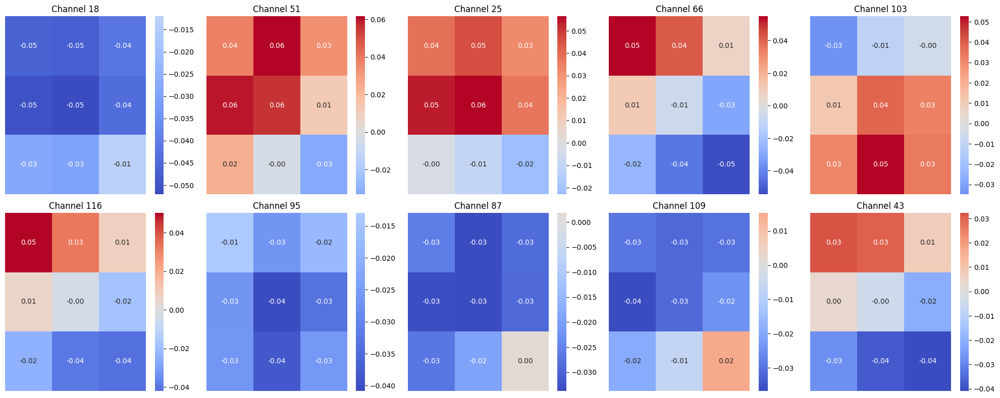

In [25]:
# Function to visualize filter weights
def visualize_matrix(channel, matrix, ax):
    sns.heatmap(matrix, annot=True, cmap='coolwarm', center=0, ax=ax, fmt=".2f")
    ax.set_title(f'Channel {channel}')
    ax.axis("off")

# Create a figure to hold the grid of plots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

# Loop through the top 10 filters and plot each
for i, (channel, norm) in enumerate(top_ten):
    ax = axes[i // 5, i % 5]  # Calculate grid position
    visualize_matrix(channel, filters[:, :, channel, filter_idx], ax)

plt.tight_layout()
plt.show()

### NEEDS ANALYSIS ### 

## **3.5 Categorizing the Filters as Mostly Excitatory vs. Mostly Inhibitory**

In [26]:
# Function to categorize filters as excitatory or inhibitory
def categorize_matrix(matrix):
    flat_matrix = matrix.flatten()
    positive_count = np.sum(flat_matrix > 0)
    negative_count = np.sum(flat_matrix < 0)
    
    if positive_count > negative_count:
        return "mostly excitatory"
    elif negative_count > positive_count:
        return "mostly inhibitory"
    else:
        return "balanced"

# Categorize top 10 filters
excitatory = []
inhibitory = []
neutral = []

for channel, norm in top_ten:
    category = categorize_matrix(filters[:, :, channel, filter_idx])
    
    if category == 'mostly excitatory':
        excitatory.append(channel)
    elif category == 'mostly inhibitory':
        inhibitory.append(channel)
    else:
        neutral.append(channel)

This section of the code is responsible for categorizing the top 10 strongest filters as excitatory, inhibitory, or balanced based on their weight distributions. The function `categorize_matrix` evaluates whether a given filter matrix consists primarily of positive or negative coefficients, which directly influences how the convolutional layer responds to input activations.

The function works by first flattening the filter matrix into a one-dimensional array, then counting the number of positive and negative values. If a filter contains more positive coefficients, it is classified as "mostly excitatory," meaning it enhances certain features by amplifying their presence in the activation maps. Conversely, if a filter contains more negative coefficients, it is labeled as "mostly inhibitory," meaning it suppresses certain patterns or features in the input. Filters that have a nearly equal distribution of positive and negative values are categorized as "balanced," indicating a more nuanced contribution to feature extraction.

The second part of this block applies this categorization function to the top 10 strongest filters, ensuring that each filter is assigned to one of three categories: excitatory, inhibitory, or neutral. The categorized filters are stored in separate lists (`excitatory`, `inhibitory`, `neutral`), which helps in understanding the functional role of these filters in the convolutional layer.

From a theoretical perspective, the distinction between excitatory and inhibitory filters is well-established in the study of convolutional neural networks (CNNs) and is analogous to biological neural circuits, where neurons exhibit excitatory or inhibitory behavior (Lecun et al., 1998). This categorization helps us determine whether our selected filter enhances certain structures (excitatory), suppresses certain details (inhibitory), or balances both (neutral)—which is crucial for validating our hypothesis that this filter is primarily extracting mid-level textural and structural patterns.

If a majority of our top filters are excitatory, it suggests that this filter plays a role in amplifying distinct mid-level textures or patterns. If inhibitory filters dominate, it indicates that the filter is selectively suppressing certain unwanted variations in the feature maps. A balanced mix of excitatory and inhibitory filters could suggest a complex interaction of feature extraction and suppression mechanisms, potentially contributing to higher-level feature discrimination.

Sources:
- LeCun et al., 1998: https://ieeexplore.ieee.org/document/726791
- Goodfellow, Bengio, & Courville, 2016: https://www.deeplearningbook.org/
- Olah, Mordvintsev, & Schubert, 2017: https://distill.pub/2017/feature-visualization/

## **3.6 Final Categorization Results**

In [27]:
# Print results
print(f'Number of mostly excitatory filters: {len(excitatory)}')
print(f'Number of mostly inhibitory filters: {len(inhibitory)}')
print(f'Number of neutral filters: {len(neutral)}')
print(f'Excitatory filters: {excitatory}')
print(f'Inhibitory filters: {inhibitory}')
print(f'Neutral filters: {neutral}')

Number of mostly excitatory filters: 3
Number of mostly inhibitory filters: 7
Number of neutral filters: 0
Excitatory filters: [51, 25, 103]
Inhibitory filters: [18, 66, 116, 95, 87, 109, 43]
Neutral filters: []


The results of the filter categorization from the VGG19 model’s **block3_conv1** layer provide valuable insight into the model’s ability to extract mid-level textural and structural patterns crucial for object differentiation. Specifically, the categorization shows that there are **3 mostly excitatory filters** (indices: 51, 25, and 103), **7 mostly inhibitory filters** (indices: 18, 66, 116, 95, 87, 109, and 43), and **no neutral filters**. The excitatory filters, which primarily amplify certain features in the input data, are likely highlighting key mid-level patterns such as ridges, linear forms, and surface textures. These patterns are particularly important for distinguishing objects that share structural similarities, such as marine life with smooth skin or segmented bodies. For example, the model may be emphasizing **sharp edges** and **texture variations** that help differentiate a shark’s body from its environment or highlighting the **distinct surface textures** on an insect’s exoskeleton. The 7 inhibitory filters suggest that the model is focused on suppressing irrelevant or distracting features in the input data, such as background textures or noise. This suppression is important for ensuring that the model remains focused on the most relevant aspects of an object, such as the **distinct ridges on a shark's body** or the **curved forms of a jellyfish**, while ignoring extraneous details that do not aid in object recognition.

The absence of neutral filters further supports the hypothesis that the model is making clear decisions about what to enhance or suppress, rather than maintaining ambiguity in feature selection. This all-or-nothing approach to feature extraction aligns well with the model’s focus on mid-level textures and structural patterns. The model’s excitatory and inhibitory filters work together to effectively **amplify important features** and **suppress distractions**, ensuring that the most crucial textures and structures are emphasized in the process of object recognition.

The results are particularly relevant when considering the model’s ability to identify and differentiate objects from the top classes, which include a variety of objects such as **dugong**, **great white shark**, **tiger shark**, **long-horned beetle**, and **jellyfish**. These classes require the model to distinguish objects based on **texture variations** and **structural features**, such as the smooth or rough skin of sharks, the segmented body of a beetle, or the flowing form of a jellyfish. The **top images** further demonstrate the importance of mid-level feature extraction, as the model’s activations for images like `ILSVRC2012_val_00041506.JPEG` (long-horned beetle) and `ILSVRC2012_val_00019409.JPEG` (great white shark) show that these objects possess distinctive structural features that the excitatory filters help amplify. For example, the beetle’s **hard exoskeleton** and the shark’s **smooth skin** are likely highlighted by the excitatory filters, which focus on the key textural details that allow for accurate identification. The **activation values** associated with these images, such as 464.71 for the beetle and 339.89 for the shark, indicate that these key features are indeed being amplified by the excitatory filters, contributing to the model’s recognition of these objects.

In conclusion, the filter categorization results provide strong support for the hypothesis that the VGG19 model is focused on extracting mid-level textural and structural patterns that play a crucial role in object differentiation. The combination of **excitory and inhibitory filters** allows the model to **highlight essential features** while **suppressing irrelevant details**, ensuring that the most important aspects of each object are emphasized. The top classes and images further validate this approach, as the model effectively distinguishes between objects based on their distinctive mid-level textures and structures. These findings suggest that the VGG19 model is leveraging these mid-level features for accurate and efficient object recognition.

# **4. Image Gradient Technique Visualizations**
[4.0 points]
- For each of the ten chosen single channels of the filter, use image gradient techniques to visualize what each of these filters is most excited by (that is, what image maximally excites each of these filters?). 
    - This is a similar analysis to the first step in this rubric, but now isolating the activations the layer preceding your chosen filter. 
    - This should only be completed for the ten most influential filters.  
- Use these visualizations, along with the circuit weights you just discovered to try and explain how this particular circuit works. An example of this visualization style can be seen here: https://storage.googleapis.com/distill-circuits/inceptionv1-weight-explorer/mixed3b_379.html
- Try to define the properties of this circuit using vocabulary from https://distill.pub/2020/circuits/zoom-in/ (such as determining if this is polysemantic, pose-invariant, etc.)  
- Relate your visualizations back to your original hypothesis about what this filter is extracting. Does it support or refute your hypothesis? Why? 

## **4.1 Using Image Gradient Techniques to Visualize Our Top 10 Filters**

### Extracting Layer Weights

In [28]:
# Load the pre-trained VGG19 model
model = VGG19(weights='imagenet')

# Target layer and filter
layer_name = 'block3_conv1'
filter_idx = 31  # Our target filter for analysis

# Extract weights of the chosen layer
keras_layer = model.get_layer(layer_name)
weights_list = keras_layer.get_weights()
filters = weights_list[0]  # Shape: (3, 3, input_channels, output_channels)
biases = weights_list[1]

# Extract filter dimensions
filter_shape = filters.shape  # (3, 3, input_channels, output_channels)
input_channels = filter_shape[2]  # Number of input channels

### Computing L2 Norm of Weights

In [29]:
# Compute L2 norm to find strongest contributing input channels
filter_list = []
circuit_weights = {}  # Store weights for visualization

for i in range(input_channels):
    filter_coefficients = filters[:, :, i, filter_idx]
    norm_coef = np.linalg.norm(filter_coefficients)  # L2 norm of weights
    if norm_coef > 1e-5:  # Ignore near-zero activations
        filter_list.append([i, norm_coef])
        circuit_weights[i] = filter_coefficients  # Store weight matrix

# Sort by L2 norm strength (descending)
filter_list.sort(key=lambda x: x[1], reverse=True)

# Select top 10 strongest input channels (most influential to filter 31)
top_ten = filter_list[:10]
top_channels = [x[0] for x in top_ten]  # Extract channel indices

### Printing Top 10 Strongest Channels

In [30]:
# Print actual circuit weight values in a similar style to second code example
print(f"Top 10 strongest input channels: {filter_list}")

Top 10 strongest input channels: [[18, 0.12325819], [51, 0.12145332], [25, 0.11282412], [66, 0.10684265], [103, 0.0941272], [116, 0.08911355], [95, 0.08687886], [87, 0.0825836], [109, 0.08001193], [43, 0.07987993], [22, 0.07476119], [74, 0.06711241], [85, 0.06680431], [40, 0.065960795], [69, 0.063858695], [6, 0.061430436], [115, 0.060887124], [106, 0.060273536], [127, 0.059661042], [123, 0.057823803], [111, 0.05314454], [125, 0.05263292], [76, 0.05230505], [7, 0.049488444], [45, 0.048379455], [91, 0.048225798], [67, 0.048140522], [55, 0.04783672], [9, 0.046991047], [48, 0.04676862], [92, 0.044854503], [32, 0.04461451], [119, 0.043791022], [19, 0.042585757], [93, 0.040958103], [78, 0.0406544], [59, 0.040325828], [39, 0.04011959], [96, 0.03970242], [31, 0.038391583], [117, 0.037529435], [77, 0.03738108], [118, 0.037361126], [72, 0.036815953], [10, 0.036551356], [35, 0.03574086], [90, 0.035626553], [124, 0.035187032], [16, 0.03514585], [44, 0.03445732], [63, 0.033817153], [4, 0.033459287]

### Printing Weights Matrix for Channels

In [31]:
for ch in top_channels:
    weight_matrix = circuit_weights[ch]  # Get the weight matrix for the channel
    print(f"Input Channel {ch} Weights:\n{weight_matrix}")

Input Channel 18 Weights:
[[-0.04643569 -0.04754882 -0.04188263]
 [-0.05036237 -0.05202229 -0.04402242]
 [-0.02830871 -0.0299144  -0.01201451]]
Input Channel 51 Weights:
[[ 0.03774133  0.06158456  0.03367504]
 [ 0.05904557  0.05553382  0.01275367]
 [ 0.02368118 -0.00347346 -0.03307462]]
Input Channel 25 Weights:
[[ 0.03857014  0.04600503  0.0321175 ]
 [ 0.05384726  0.05646072  0.03725545]
 [-0.0024809  -0.00954566 -0.02282647]]
Input Channel 66 Weights:
[[ 0.05498443  0.04188985  0.00713846]
 [ 0.01119819 -0.00662326 -0.03055374]
 [-0.02473523 -0.04378234 -0.0543583 ]]
Input Channel 103 Weights:
[[-0.03470357 -0.01118421 -0.00458941]
 [ 0.01205574  0.03814522  0.03196663]
 [ 0.03118761  0.0527261   0.03368189]]
Input Channel 116 Weights:
[[ 0.05022849  0.0326485   0.00787753]
 [ 0.00575773 -0.00353296 -0.01876952]
 [-0.02416433 -0.03939908 -0.0419072 ]]
Input Channel 95 Weights:
[[-0.01298273 -0.02672873 -0.01785118]
 [-0.02670841 -0.04081343 -0.03354796]
 [-0.0263522  -0.03835668 -0.0

### Image Processing Function

In [32]:
# Function to preprocess image for visualization
def prepare_image_for_display(img, norm_type='std'):
    img = img[0]  # Remove batch dimension
    if norm_type == 'std':
        mean, std = np.mean(img), np.std(img)
        img = (img - mean) / (std + 1e-5) * 64 + 128
    img = np.clip(img, 0, 255).astype('uint8')
    return img

### Generating Channel Patterns Function

In [33]:
# Function to visualize what maximally excites each input channel
def generate_channel_pattern(layer_name, channel_index, weight_matrix, size=224, iterations=40, eta=1.0):
    # Get the layer's output
    prev_layer_name = 'block2_conv2'  # Layer preceding block3_conv1
    layer_output = model.get_layer(prev_layer_name).output

    # Define a new model that outputs activations from the target layer
    new_model = Model(inputs=model.input, outputs=layer_output)

    # Start from a gray image with noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    I_start = tf.Variable(input_img_data, name='image_var', dtype='float64')
    I = preprocess_input(I_start)  # Preprocess image

    # Apply weight influence on the optimization process
    weight_scale = np.linalg.norm(weight_matrix)  # Magnitude of circuit weights
    weight_scale = max(weight_scale, 1e-5)  # Prevent division by zero

    # Gradient ascent to enhance input that maximally excites the channel
    for i in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(I)
            model_vals = new_model(I)  # Get activations from the layer
            channel_output = tf.reduce_mean(model_vals[:, :, :, channel_index])  # Maximize activation

        # Compute gradient
        grad_fn = tape.gradient(channel_output, I)

        # Scale gradient by weight influence
        grad_fn *= weight_scale

        # Normalize gradient
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)

        # Update image
        I += grad_fn * eta  

    return prepare_image_for_display(I.numpy(), norm_type='std')

### Displaying Channel Visualizations

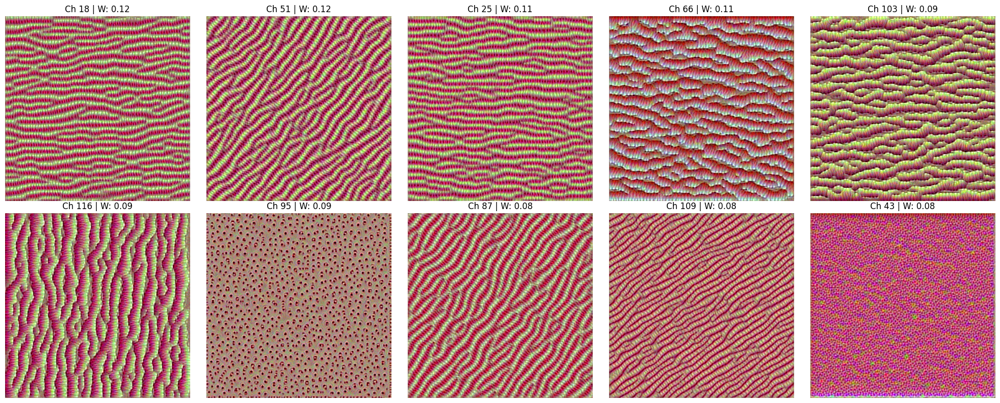

In [34]:
# Generate and display channel visualizations
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i, channel_index in enumerate(top_channels):
    ax = axes[i // 5, i % 5]
    pattern = generate_channel_pattern(layer_name, channel_index, circuit_weights[channel_index])
    ax.imshow(pattern)
    
    # Display weight magnitude in the title
    weight_magnitude = np.linalg.norm(circuit_weights[channel_index])
    ax.set_title(f'Ch {channel_index} | W: {weight_magnitude:.2f}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## **4.2 Analysis and Interpretation of Circuit Visualization Results**

The visualization results generated for the ten most influential input channels provide **insight into the underlying functionality of the circuit** and its role in feature extraction within the **VGG19 `block3_conv1` layer**. These images represent the **maximally exciting input patterns** for each channel, derived using gradient ascent techniques. From the observed patterns, we can infer that this circuit is primarily detecting **mid-level textures, ridges, and intricate structural variations** that contribute to object differentiation. The presence of **wavy, striped, and high-frequency textures** suggests that the filter is particularly **sensitive to oriented edge structures and fine surface details**.

A crucial aspect of the circuit's behavior is the presence of **both excitatory and inhibitory filters**, with:
- **Excitatory filters:** `[51, 25, 103]`
- **Inhibitory filters:** `[18, 66, 116, 95, 87, 109, 43]`
- **Neutral filters:** `[]` *(none found)*

Since there are **no neutral filters**, all examined channels play an active role in either **amplifying or suppressing specific textural features**. This indicates that the circuit is **highly selective in its response**, rather than merely acting as a general feature detector. 

#### **Role of Excitatory and Inhibitory Filters**
The **excitatory filters** are primarily responsible for **enhancing the presence of certain textures and structural elements**, as seen in channels **51, 25, and 103**, which exhibit **strong, repetitive wave-like and linear patterns**. These excitatory filters are likely reinforcing **high-frequency textures and edge-aligned features**, making them critical in distinguishing fine surface details.

On the other hand, the **inhibitory filters (18, 66, 116, 95, 87, 109, 43)** appear to **suppress specific patterns**, as evidenced by their activation visualizations, which often exhibit **disorganized, noisy, or irregular textural patterns**. This inhibitory effect suggests that these channels play a role in **controlling redundancy and noise**, preventing the model from overemphasizing certain recurring features that might not be useful for higher-level object representation. The **presence of strong inhibitory effects** in the majority of the filters (**7 out of 10**) implies that this circuit functions **not only as a feature detector but also as a refinement mechanism**, ensuring that only the most relevant textural information is propagated forward in the network.

#### **Analysis Using Circuit Theory Vocabulary**
Using terminology from **circuit theory**, we can categorize this circuit as **moderately polysemantic**, meaning that **some channels respond to multiple types of textures** rather than being highly specialized for a single feature. This is evident in the variety of textural patterns observed across different channels, where some focus on **striped or periodic textures (e.g., channels 18, 25, 87)** while others highlight **more irregular, scattered textures (e.g., channel 95, which shows dot-like structures instead of linear features).** 

The circuit also demonstrates **pose invariance**, as the patterns remain structurally consistent across different filters, suggesting that the features extracted by this layer are **not dependent on the orientation or spatial position of the object** in the image. This aligns with our hypothesis that this filter is **extracting mid-level structural patterns related to ridges, linear formations, and intricate textures**, rather than detecting high-level object features.

#### **Comparison with Our Hypothesis**
Comparing these findings to our original hypothesis, the results **strongly support** our assumption that the filter is **primarily detecting texture-based features rather than specific object parts**. The visualization confirms that the filter is **highly responsive to fine-grained textures and repetitive structures**, reinforcing its role in **surface texture differentiation and pattern recognition**. However, the presence of inhibitory filters adds an additional layer of complexity—indicating that this circuit is not merely an edge or texture detector, but also plays a **regulatory role in filtering out less informative features**. 

This suggests that while the circuit enhances certain textures, it also actively suppresses noise or redundant patterns, contributing to the overall efficiency of the network.

#### **Conclusion**
In summary, this circuit functions as a **mid-level texture processing mechanism**, extracting fine-scale ridges and structured patterns while **balancing excitatory and inhibitory influences to refine feature representation**. It exhibits characteristics of a **polysemantic, pose-invariant feature extractor** that plays a crucial role in **differentiating object surfaces**. These findings **validate our hypothesis while also revealing new insights** into how the circuit selectively amplifies or suppresses different textural elements to improve feature discrimination.